<a href="https://colab.research.google.com/github/esaghapour/Data/blob/main/CoNIC_deeplabv3_plus_V02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Multiclass semantic segmentation using DeepLabV3+


> Indented block



## Introduction

Semantic segmentation, with the goal to assign semantic labels to every pixel in an image,
is an essential computer vision task. In this example, we implement
the **DeepLabV3+** model for multi-class semantic segmentation, a fully-convolutional
architecture that performs well on semantic segmentation benchmarks.

### References:

- [Encoder-Decoder with Atrous Separable Convolution for Semantic Image Segmentation](https://arxiv.org/pdf/1802.02611.pdf)
- [Rethinking Atrous Convolution for Semantic Image Segmentation](https://arxiv.org/abs/1706.05587)
- [DeepLab: Semantic Image Segmentation with Deep Convolutional Nets, Atrous Convolution, and Fully Connected CRFs](https://arxiv.org/abs/1606.00915)

## Downloading the data

We will use the [Crowd Instance-level Human Parsing Dataset](https://arxiv.org/abs/1811.12596)
for training our model. The Crowd Instance-level Human Parsing (CIHP) dataset has 38,280 diverse human images.
Each image in CIHP is labeled with pixel-wise annotations for 20 categories, as well as instance-level identification.
This dataset can be used for the "human part segmentation" task.

In [ ]:
import os
import cv2
import numpy as np
from glob import glob
from scipy.io import loadmat
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [ ]:
!gdown https://drive.google.com/uc?id=1B9A9UCJYMwTL4oBEo4RZfbMZMaZhKJaz
!unzip -q instance-level-human-parsing.zip

Downloading...
From: https://drive.google.com/uc?id=1B9A9UCJYMwTL4oBEo4RZfbMZMaZhKJaz
To: /content/instance-level-human-parsing.zip
100% 2.91G/2.91G [00:43<00:00, 67.5MB/s]


## Creating a TensorFlow Dataset

Training on the entire CIHP dataset with 38,280 images takes a lot of time, hence we will be using
a smaller subset of 200 images for training our model in this example.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd

In [ ]:
list_name=pd.read_csv('/content/drive/MyDrive/CoNIC_Challenge/patch_info.csv')

In [ ]:
label=np.load('/content/drive/MyDrive/CoNIC_Challenge/labels.npy')

In [ ]:
img_data=np.load('/content/drive/MyDrive/CoNIC_Challenge/images.npy')


In [ ]:
!mkdir /content/label_1
!mkdir /content/label_0
!mkdir /content/training


In [ ]:
itr=0
ss=np.zeros((256,256,3))
for patch_info in list_name['patch_info']:
   ss[ :, :, 0]=label[itr, :, :, 0]
   ss[ :, :, 1]=label[itr, :, :, 0]
   ss[ :, :, 2]=label[itr, :, :, 0]
   cv2.imwrite('/content/label_0/'+ patch_info+'.png',ss)
   itr=itr+1

In [ ]:
itr=0
ss=np.zeros((256,256,3))

for patch_info in list_name['patch_info']:
   ss[ :, :, 0]=label[itr, :, :, 1]
   ss[ :, :, 1]=label[itr, :, :, 1]
   ss[ :, :, 2]=label[itr, :, :, 1]
   cv2.imwrite('/content/label_1/'+ patch_info+'.png',ss)
   itr=itr+1

In [ ]:
from PIL import Image
im = Image.fromarray(label[0, :, :, 0])
im.save("your_file.png")

In [ ]:
image=cv2.imread('/content/label_1/consep_1-0000.png')

In [ ]:

np.max(image[:,:,0])

6

In [ ]:
np.max(image)

0

In [ ]:
itr=0
for patch_info in list_name['patch_info']:
   cv2.imwrite('/content/training/'+ patch_info+'.png',img_data[itr, :, :, :])
   itr=itr+1

In [ ]:
4981*.1


498.1

In [ ]:
IMAGE_SIZE = 256
BATCH_SIZE = 4
NUM_CLASSES = 7
DATA_DIR = "/content/"
NUM_TRAIN_IMAGES = 4000
NUM_VAL_IMAGES = 500
NUM_TEST_IMAGES= 481

train_images = sorted(glob(os.path.join(DATA_DIR, "training/*")))[:NUM_TRAIN_IMAGES]
train_masks = sorted(glob(os.path.join(DATA_DIR, "label_1/*")))[:NUM_TRAIN_IMAGES]
val_images = sorted(glob(os.path.join(DATA_DIR, "training/*")))[
    NUM_TRAIN_IMAGES : NUM_VAL_IMAGES + NUM_TRAIN_IMAGES
]
val_masks = sorted(glob(os.path.join(DATA_DIR, "label_1/*")))[
    NUM_TRAIN_IMAGES : NUM_VAL_IMAGES + NUM_TRAIN_IMAGES
]

test_images = sorted(glob(os.path.join(DATA_DIR, "training/*")))[
    NUM_VAL_IMAGES + NUM_TRAIN_IMAGES :
]
test_masks = sorted(glob(os.path.join(DATA_DIR, "label_1/*")))[
    NUM_VAL_IMAGES + NUM_TRAIN_IMAGES :
]


In [ ]:
train_images

['/content/training/consep_1-0000.png',
 '/content/training/consep_1-0001.png',
 '/content/training/consep_1-0002.png',
 '/content/training/consep_1-0003.png',
 '/content/training/consep_10-0000.png',
 '/content/training/consep_10-0001.png',
 '/content/training/consep_10-0002.png',
 '/content/training/consep_10-0003.png',
 '/content/training/consep_11-0000.png',
 '/content/training/consep_11-0001.png',
 '/content/training/consep_11-0002.png',
 '/content/training/consep_11-0003.png',
 '/content/training/consep_12-0000.png',
 '/content/training/consep_12-0001.png',
 '/content/training/consep_12-0002.png',
 '/content/training/consep_12-0003.png',
 '/content/training/consep_13-0000.png',
 '/content/training/consep_13-0001.png',
 '/content/training/consep_13-0002.png',
 '/content/training/consep_13-0003.png',
 '/content/training/consep_14-0000.png',
 '/content/training/consep_14-0001.png',
 '/content/training/consep_14-0002.png',
 '/content/training/consep_14-0003.png',
 '/content/training/

In [ ]:
!gdown https://drive.google.com/drive/folders/1il9jG7uA4-ebQ_lNmXbbF2eOK9uNwheb?usp=sharing

/usr/local/lib/python3.9/dist-packages/gdown/parse_url.py:35: UserWarning: You specified a Google Drive link that is not the correct link to download a file. You might want to try `--fuzzy` option or the following url: https://drive.google.com/uc?id=None
  warnings.warn(
Downloading...
From: https://drive.google.com/drive/folders/1il9jG7uA4-ebQ_lNmXbbF2eOK9uNwheb?usp=sharing
To: /content/1il9jG7uA4-ebQ_lNmXbbF2eOK9uNwheb?usp=sharing
259kB [00:00, 1.18MB/s]


In [ ]:
np.shape(train_images)

(4000,)

In [ ]:
val_masks

In [ ]:


def read_image(image_path, mask=False):
    image = tf.io.read_file(image_path)
    if mask:
        image = tf.image.decode_png(image, channels=1)
        image.set_shape([None, None, 1])
        image = tf.image.resize(images=image, size=[IMAGE_SIZE, IMAGE_SIZE])
    else:
        image = tf.image.decode_png(image, channels=3)
        image.set_shape([None, None, 3])
        image = tf.image.resize(images=image, size=[IMAGE_SIZE, IMAGE_SIZE])
        image = image / 127.5 - 1
    return image


def load_data(image_list, mask_list):
    image = read_image(image_list)
    mask = read_image(mask_list, mask=True)
    return image, mask


def data_generator(image_list, mask_list):
    dataset = tf.data.Dataset.from_tensor_slices((image_list, mask_list))
    dataset = dataset.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)
    return dataset


train_dataset = data_generator(train_images, train_masks)
val_dataset = data_generator(val_images, val_masks)
test_dataset = data_generator(test_images, test_masks)

print("Train Dataset:", train_dataset)
print("Val Dataset:", val_dataset)
print("Test Dataset:", test_dataset)

Train Dataset: <BatchDataset element_spec=(TensorSpec(shape=(4, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(4, 256, 256, 1), dtype=tf.float32, name=None))>
Val Dataset: <BatchDataset element_spec=(TensorSpec(shape=(4, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(4, 256, 256, 1), dtype=tf.float32, name=None))>
Test Dataset: <BatchDataset element_spec=(TensorSpec(shape=(4, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(4, 256, 256, 1), dtype=tf.float32, name=None))>


## Building the DeepLabV3+ model

DeepLabv3+ extends DeepLabv3 by adding an encoder-decoder structure. The encoder module
processes multiscale contextual information by applying dilated convolution at multiple
scales, while the decoder module refines the segmentation results along object boundaries.

![](https://github.com/lattice-ai/DeepLabV3-Plus/raw/master/assets/deeplabv3_plus_diagram.png)

**Dilated convolution:** With dilated convolution, as we go deeper in the network, we can keep the
stride constant but with larger field-of-view without increasing the number of parameters
or the amount of computation. Besides, it enables larger output feature maps, which is
useful for semantic segmentation.

The reason for using **Dilated Spatial Pyramid Pooling** is that it was shown that as the
sampling rate becomes larger, the number of valid filter weights (i.e., weights that
are applied to the valid feature region, instead of padded zeros) becomes smaller.

In [ ]:

def convolution_block(
    block_input,
    num_filters=256,
    kernel_size=3,
    dilation_rate=1,
    padding="same",
    use_bias=False,
):
    x = layers.Conv2D(
        num_filters,
        kernel_size=kernel_size,
        dilation_rate=dilation_rate,
        padding="same",
        use_bias=use_bias,
        kernel_initializer=keras.initializers.HeNormal(),
    )(block_input)
    x = layers.BatchNormalization()(x)
    return tf.nn.relu(x)


def DilatedSpatialPyramidPooling(dspp_input):
    dims = dspp_input.shape
    x = layers.AveragePooling2D(pool_size=(dims[-3], dims[-2]))(dspp_input)
    x = convolution_block(x, kernel_size=1, use_bias=True)
    out_pool = layers.UpSampling2D(
        size=(dims[-3] // x.shape[1], dims[-2] // x.shape[2]), interpolation="bilinear",
    )(x)

    out_1 = convolution_block(dspp_input, kernel_size=1, dilation_rate=1)
    out_6 = convolution_block(dspp_input, kernel_size=3, dilation_rate=6)
    out_12 = convolution_block(dspp_input, kernel_size=3, dilation_rate=12)
    out_18 = convolution_block(dspp_input, kernel_size=3, dilation_rate=18)

    x = layers.Concatenate(axis=-1)([out_pool, out_1, out_6, out_12, out_18])
    output = convolution_block(x, kernel_size=1)
    return output


The encoder features are first bilinearly upsampled by a factor 4, and then
concatenated with the corresponding low-level features from the network backbone that
have the same spatial resolution. For this example, we
use a ResNet50 pretrained on ImageNet as the backbone model, and we use
the low-level features from the `conv4_block6_2_relu` block of the backbone.

In [ ]:

def DeeplabV3Plus(image_size, num_classes):
    model_input = keras.Input(shape=(image_size, image_size, 3))
    resnet50 = keras.applications.ResNet50(
        weights="imagenet", include_top=False, input_tensor=model_input
    )
    x = resnet50.get_layer("conv4_block6_2_relu").output
    x = DilatedSpatialPyramidPooling(x)

    input_a = layers.UpSampling2D(
        size=(image_size // 4 // x.shape[1], image_size // 4 // x.shape[2]),
        interpolation="bilinear",
    )(x)
    input_b = resnet50.get_layer("conv2_block3_2_relu").output
    input_b = convolution_block(input_b, num_filters=48, kernel_size=1)

    x = layers.Concatenate(axis=-1)([input_a, input_b])
    x = convolution_block(x)
    x = convolution_block(x)
    x = layers.UpSampling2D(
        size=(image_size // x.shape[1], image_size // x.shape[2]),
        interpolation="bilinear",
    )(x)
    model_output = layers.Conv2D(num_classes, kernel_size=(1, 1), padding="same")(x)
    return keras.Model(inputs=model_input, outputs=model_output)


model = DeeplabV3Plus(image_size=IMAGE_SIZE, num_classes=NUM_CLASSES)
model.summary()

94765736/94765736 [==============================] - 1s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                             

## Training

We train the model using sparse categorical crossentropy as the loss function, and
Adam as the optimizer.

Epoch 1/25
1000/1000 [==============================] - 157s 111ms/step - loss: 0.3322 - accuracy: 0.8827 - val_loss: 1.1016 - val_accuracy: 0.8276
Epoch 2/25
1000/1000 [==============================] - 112s 112ms/step - loss: 0.2758 - accuracy: 0.8985 - val_loss: 0.9011 - val_accuracy: 0.8347
Epoch 3/25
1000/1000 [==============================] - 111s 111ms/step - loss: 0.2565 - accuracy: 0.9044 - val_loss: 0.9481 - val_accuracy: 0.8379
Epoch 4/25
1000/1000 [==============================] - 112s 112ms/step - loss: 0.2423 - accuracy: 0.9087 - val_loss: 0.7029 - val_accuracy: 0.8421
Epoch 5/25
1000/1000 [==============================] - 112s 112ms/step - loss: 0.2299 - accuracy: 0.9126 - val_loss: 0.6817 - val_accuracy: 0.8434
Epoch 6/25
1000/1000 [==============================] - 112s 112ms/step - loss: 0.2206 - accuracy: 0.9154 - val_loss: 0.5956 - val_accuracy: 0.8438
Epoch 7/25
1000/1000 [==============================] - 111s 111ms/step - loss: 0.2116 - accuracy: 0.9181 - val_

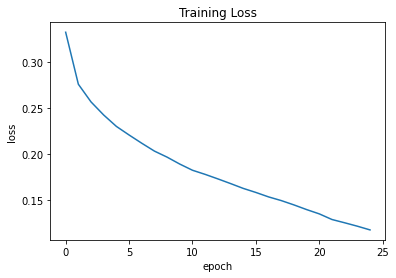

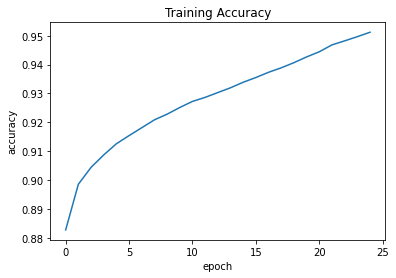

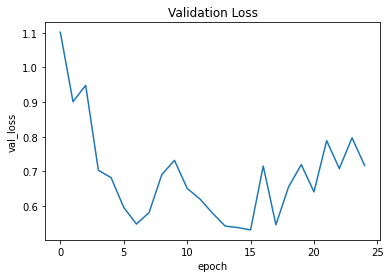

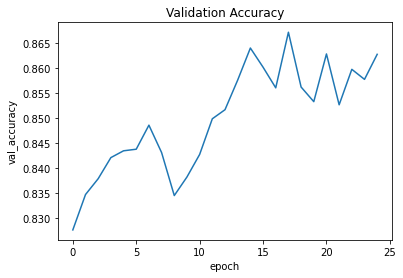

In [ ]:
loss = keras.losses.SparseCategoricalCrossentropy(from_logits=True)
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss=loss,
    metrics=["accuracy"],
)

history = model.fit(train_dataset, validation_data=val_dataset, epochs=25)

plt.plot(history.history["loss"])
plt.title("Training Loss")
plt.ylabel("loss")
plt.xlabel("epoch")
plt.show()

plt.plot(history.history["accuracy"])
plt.title("Training Accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.show()

plt.plot(history.history["val_loss"])
plt.title("Validation Loss")
plt.ylabel("val_loss")
plt.xlabel("epoch")
plt.show()

plt.plot(history.history["val_accuracy"])
plt.title("Validation Accuracy")
plt.ylabel("val_accuracy")
plt.xlabel("epoch")
plt.show()

In [ ]:
model.save("saved_model/my_model")

## Inference using Colormap Overlay

The raw predictions from the model represent a one-hot encoded tensor of shape `(N, 512, 512, 20)`
where each one of the 20 channels is a binary mask corresponding to a predicted label.
In order to visualize the results, we plot them as RGB segmentation masks where each pixel
is represented by a unique color corresponding to the particular label predicted. We can easily
find the color corresponding to each label from the `human_colormap.mat` file provided as part
of the dataset. We would also plot an overlay of the RGB segmentation mask on the input image as
this further helps us to identify the different categories present in the image more intuitively.

In [ ]:
# Loading the Colormap
colormap = loadmat(
    "/content/human_colormap.mat"
)["colormap"]
colormap = colormap * 100
colormap = colormap.astype(np.uint8)


In [ ]:
colormap

array([[ 0,  0,  0],
       [50,  0,  0],
       [99,  0,  0],
       [ 0, 33,  0],
       [66,  0, 19],
       [99, 33,  0],
       [ 0,  0, 33],
       [ 0, 46, 86],
       [33, 33,  0],
       [ 0, 33, 33],
       [33, 19,  0],
       [20, 33, 50],
       [ 0, 50,  0],
       [ 0,  0, 99],
       [19, 66, 86],
       [ 0, 99, 99],
       [33, 99, 66],
       [66, 99, 33],
       [99, 99,  0],
       [99, 66,  0]], dtype=uint8)

In [ ]:
colormap=colormap[12:19,:]

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.colors as colors

# Define the RGB values for the 6 colors
colors_list = [[0,0,0],[1, 0, 0],    # red
               [1, 0.5, 0],  # orange
               [1, 1, 0],    # yellow
               [0, 1, 0],    # green
               [0, 0, 1],    # blue
               [0.5, 0, 1] ] # purple

In [ ]:
cc=np.array(colors_list)

In [ ]:
colormap[0,:]=[ 0,  0,  0]

In [ ]:



def infer(model, image_tensor):
    predictions = model.predict(np.expand_dims((image_tensor), axis=0))
    predictions = np.squeeze(predictions)
    predictions = np.argmax(predictions, axis=2)
    return predictions


def decode_segmentation_masks(mask, colormap, n_classes):
    r = np.zeros_like(mask).astype(np.uint8)
    g = np.zeros_like(mask).astype(np.uint8)
    b = np.zeros_like(mask).astype(np.uint8)
    for l in range(0, n_classes):
        idx = mask == l
        r[idx] = colormap[l, 0]
        g[idx] = colormap[l, 1]
        b[idx] = colormap[l, 2]
    rgb = np.stack([r, g, b], axis=2)
    return rgb


def get_overlay(image, colored_mask):
    image = tf.keras.preprocessing.image.array_to_img(image)
    image = np.array(image).astype(np.uint8)
    overlay = cv2.addWeighted(image, 0.35, colored_mask, 0.65, 0)
    return overlay


def plot_samples_matplotlib(display_list, figsize=(5, 3)):
    _, axes = plt.subplots(nrows=1, ncols=len(display_list), figsize=figsize)
    for i in range(len(display_list)):
        if display_list[i].shape[-1] == 3:
            axes[i].imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        else:
            axes[i].imshow(display_list[i])
    plt.show()


def plot_predictions(images_list, colormap, model):
    for image_file in images_list:
        image_tensor = read_image(image_file)
        prediction_mask = infer(image_tensor=image_tensor, model=model)
        prediction_colormap = decode_segmentation_masks(prediction_mask, colormap, 7)
        overlay = get_overlay(image_tensor, prediction_colormap)
        plot_samples_matplotlib(
            [image_tensor, overlay, prediction_colormap], figsize=(18, 14)
        )


### Inference on Train Images

In [ ]:
/content/saved_model

'/content/label_1/consep_1-0000.png'

In [ ]:
train_images[:10]

['/content/training/consep_1-0000.png',
 '/content/training/consep_1-0001.png',
 '/content/training/consep_1-0002.png',
 '/content/training/consep_1-0003.png',
 '/content/training/consep_10-0000.png',
 '/content/training/consep_10-0001.png',
 '/content/training/consep_10-0002.png',
 '/content/training/consep_10-0003.png',
 '/content/training/consep_11-0000.png',
 '/content/training/consep_11-0001.png']

1/1 [==============================] - 0s 130ms/step


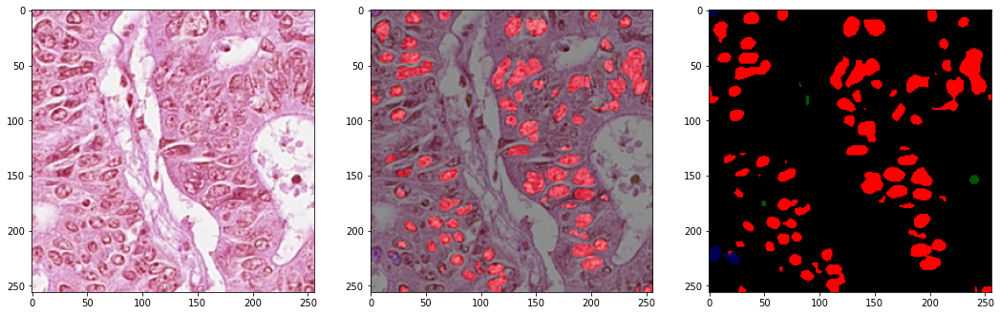

1/1 [==============================] - 0s 50ms/step


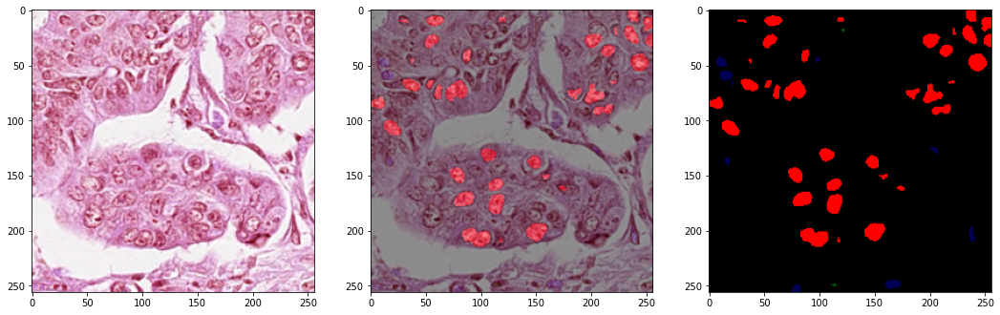

1/1 [==============================] - 0s 60ms/step


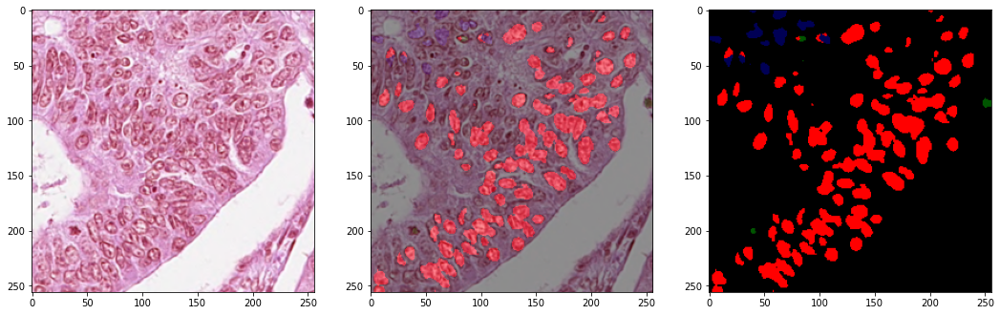

1/1 [==============================] - 0s 52ms/step


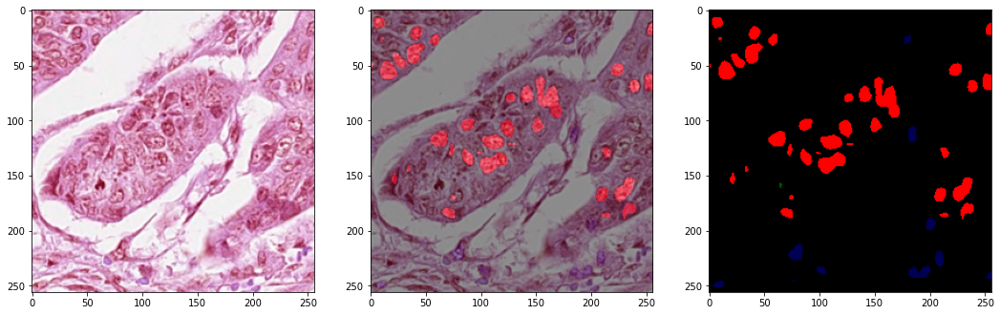

1/1 [==============================] - 0s 36ms/step


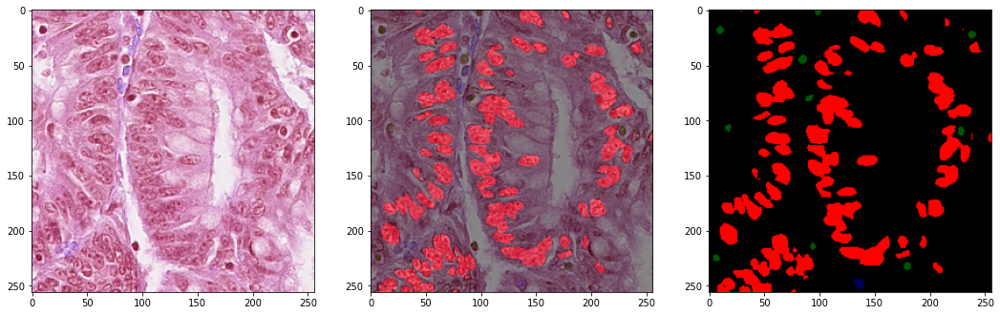

1/1 [==============================] - 0s 43ms/step


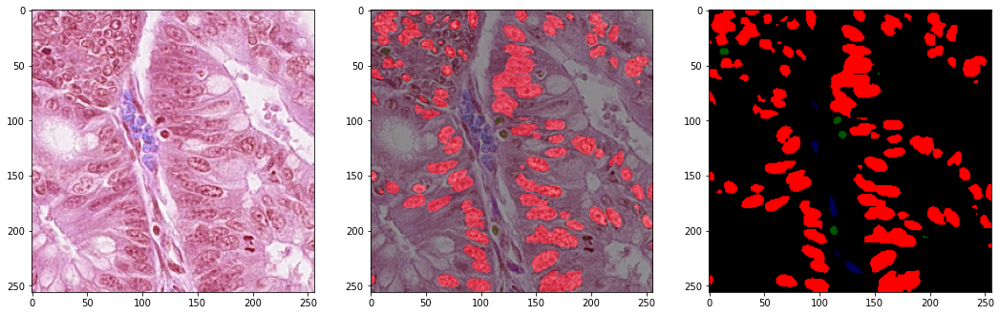

1/1 [==============================] - 0s 38ms/step


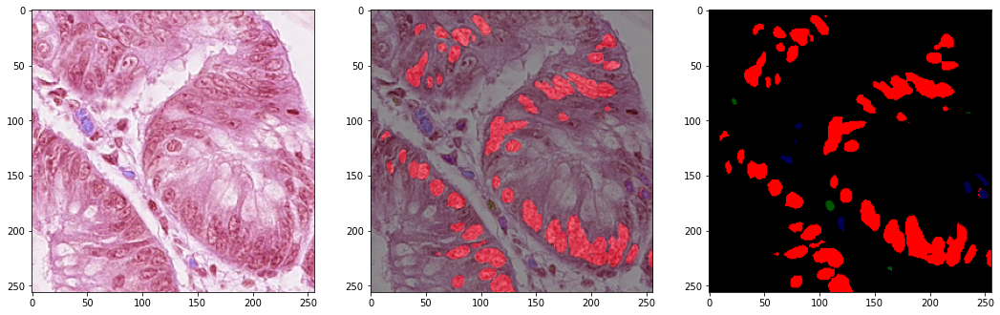

1/1 [==============================] - 0s 39ms/step


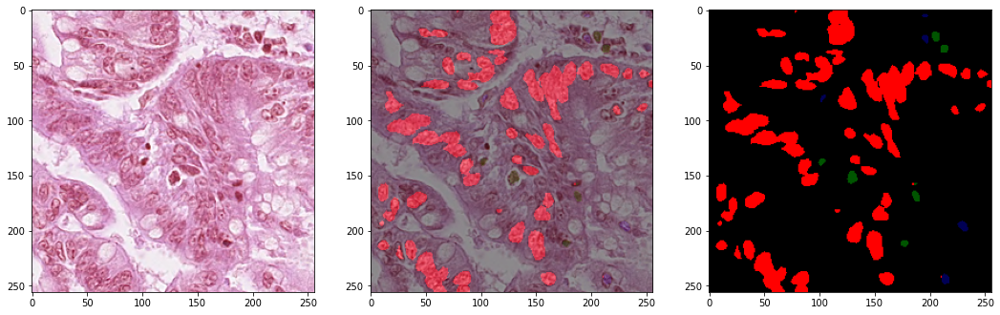

1/1 [==============================] - 0s 38ms/step


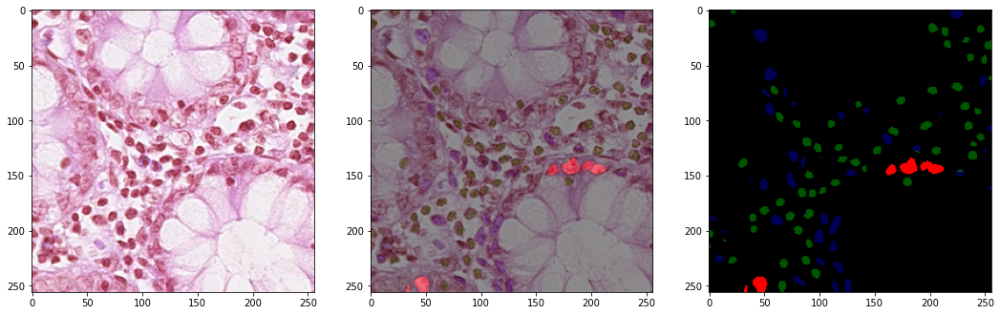

1/1 [==============================] - 0s 45ms/step


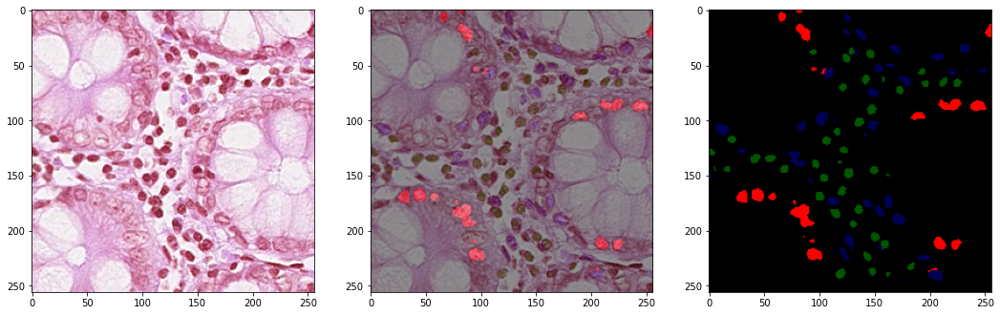

In [ ]:
plot_predictions(train_images[:10], colormap, model=model)

### Inference on Validation Images

1/1 [==============================] - 0s 28ms/step


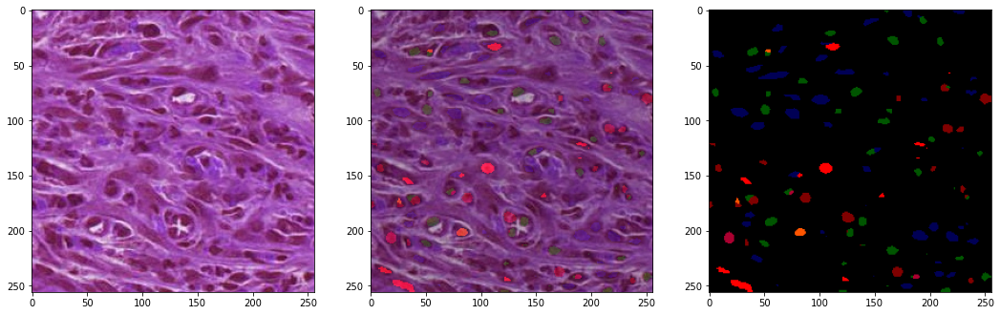

1/1 [==============================] - 0s 42ms/step


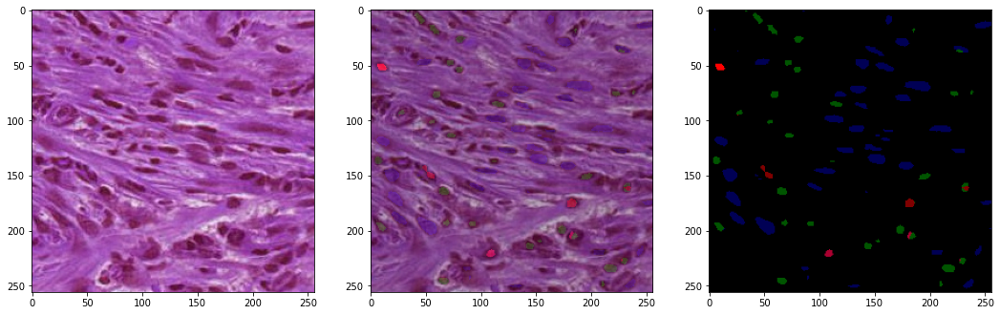

1/1 [==============================] - 0s 40ms/step


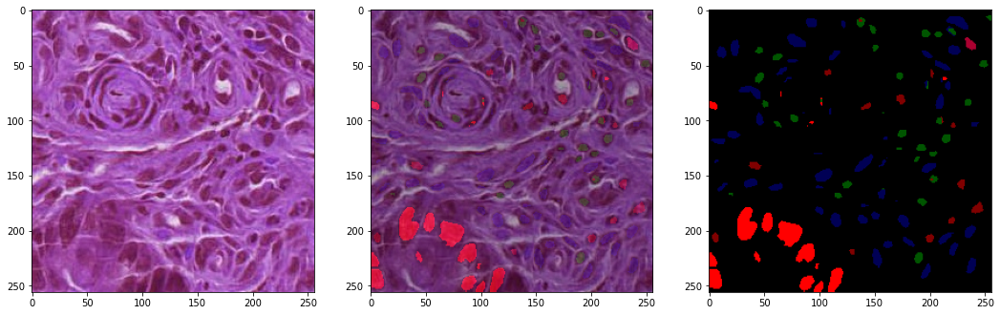

1/1 [==============================] - 0s 41ms/step


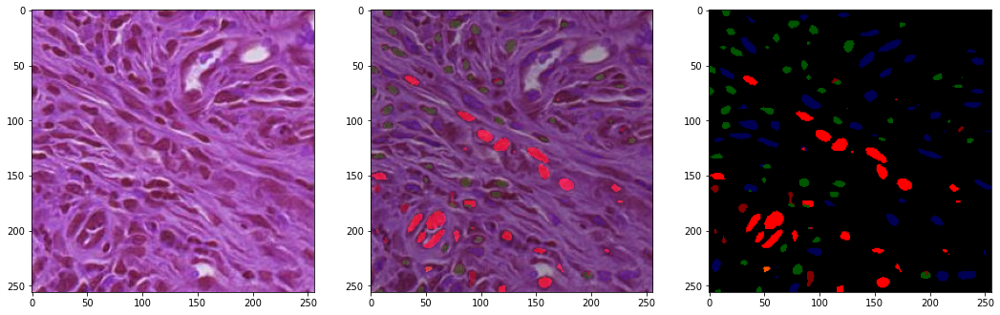

1/1 [==============================] - 0s 47ms/step


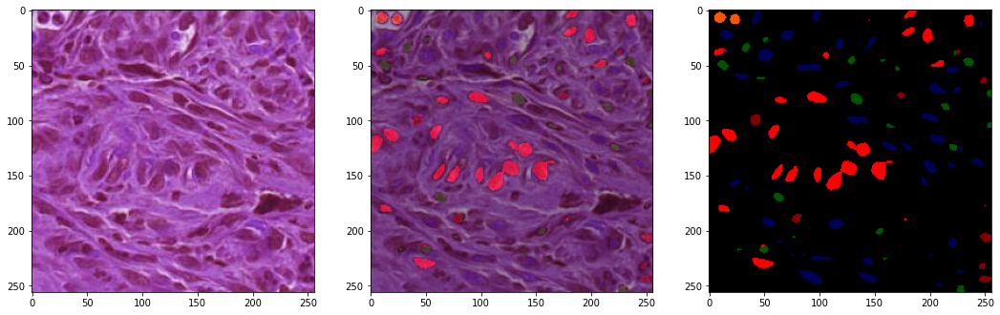

1/1 [==============================] - 0s 39ms/step


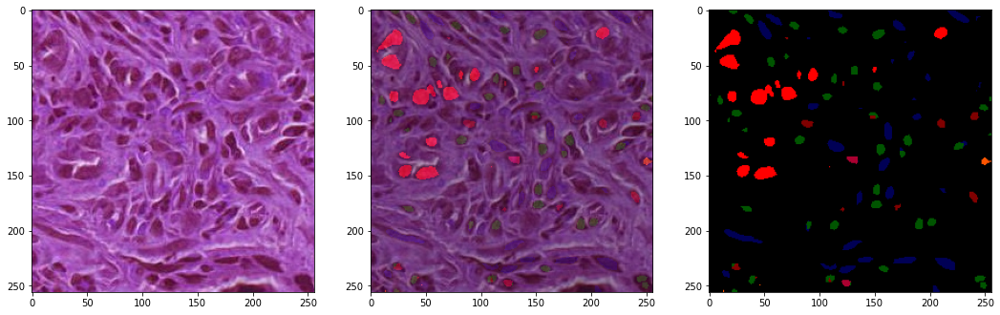

1/1 [==============================] - 0s 41ms/step


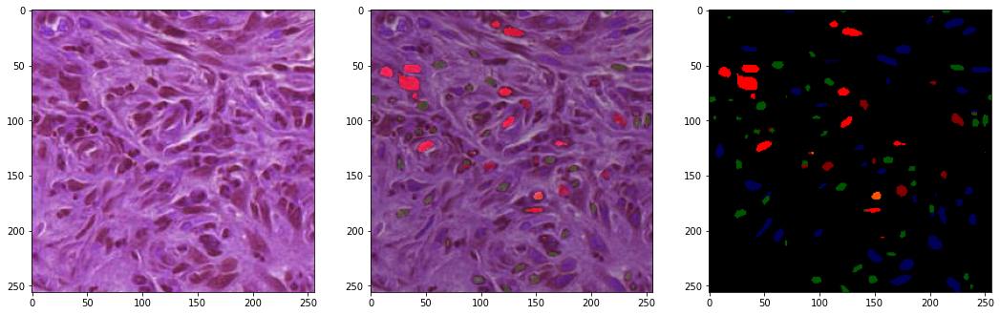

1/1 [==============================] - 0s 44ms/step


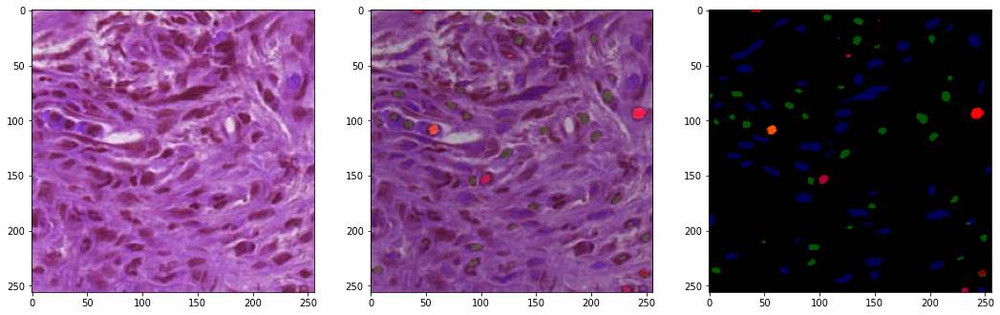

1/1 [==============================] - 0s 47ms/step


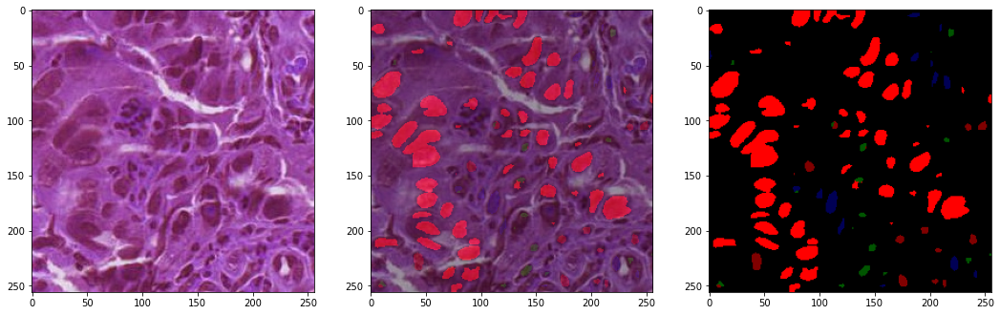

1/1 [==============================] - 0s 74ms/step


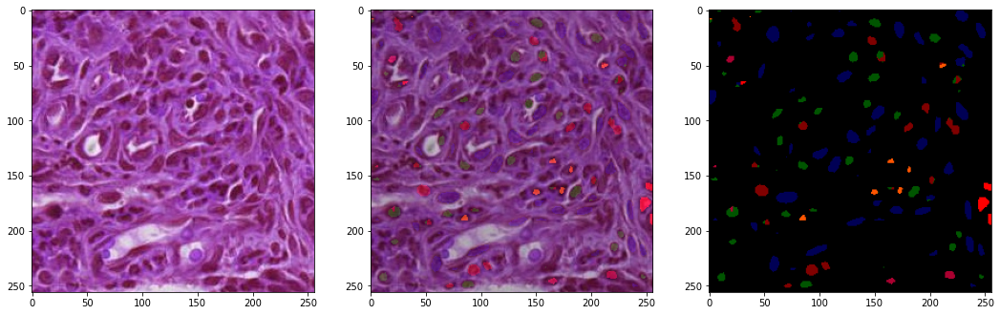

In [ ]:
plot_predictions(val_images[:10], colormap, model=model)

1/1 [==============================] - 0s 69ms/step


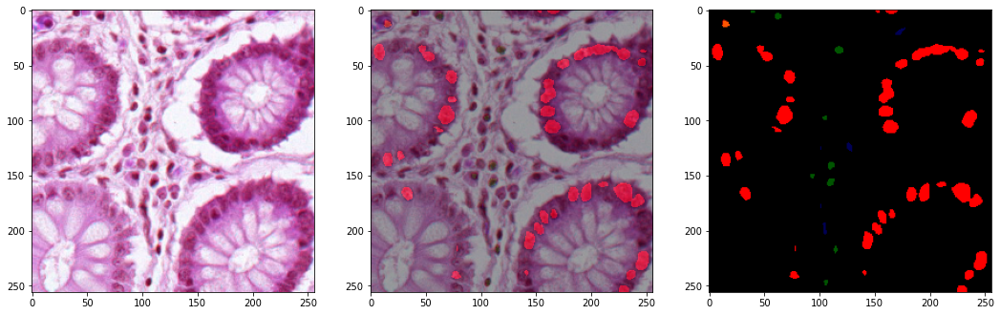

1/1 [==============================] - 0s 138ms/step


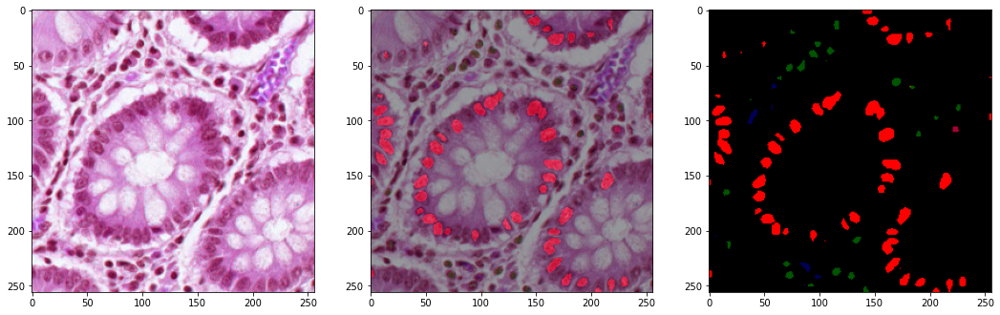

1/1 [==============================] - 0s 102ms/step


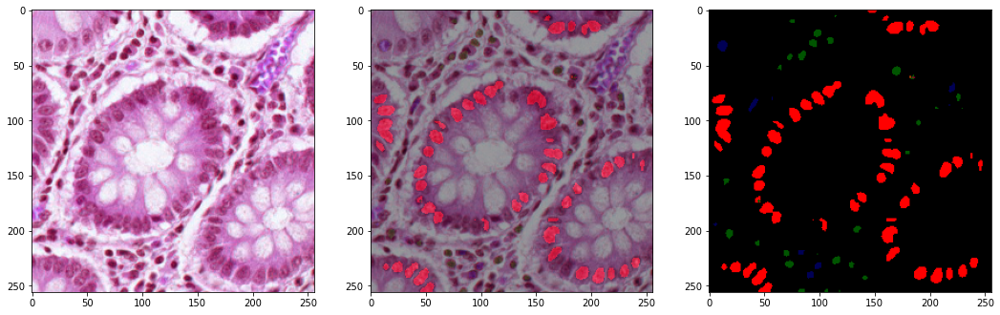

1/1 [==============================] - 0s 54ms/step


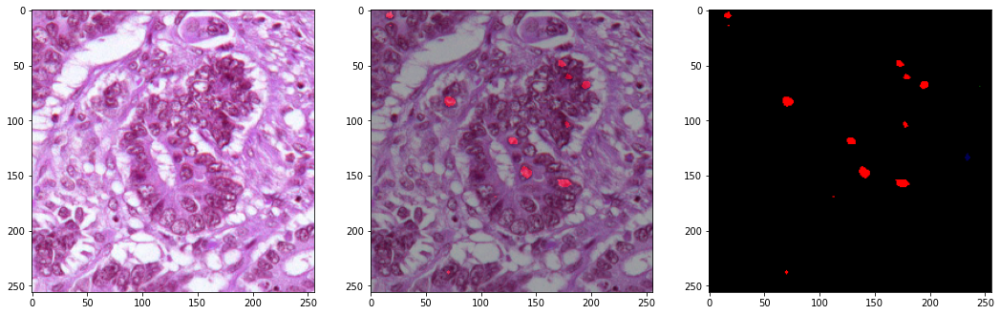

1/1 [==============================] - 0s 41ms/step


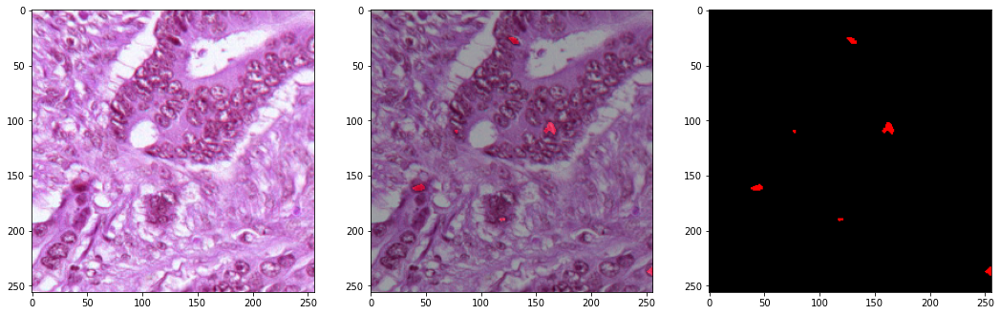

1/1 [==============================] - 0s 43ms/step


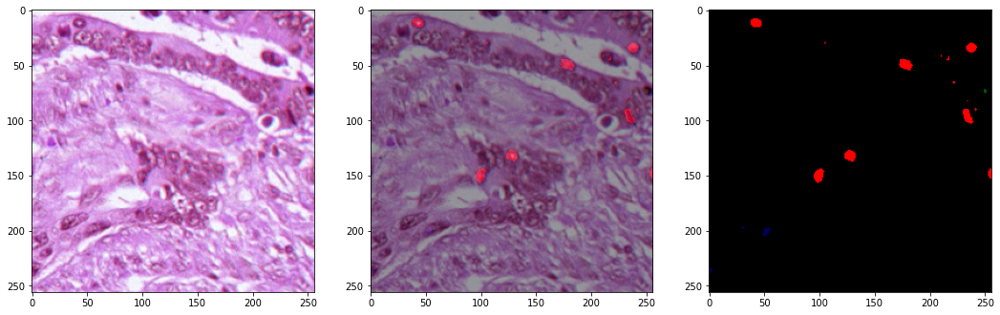

1/1 [==============================] - 0s 52ms/step


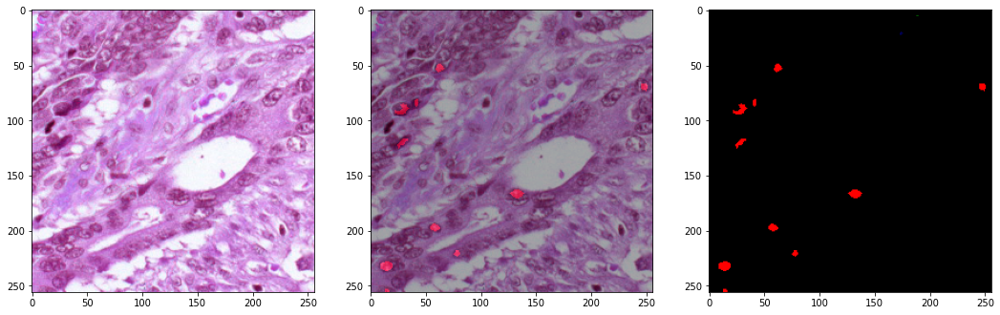

1/1 [==============================] - 0s 52ms/step


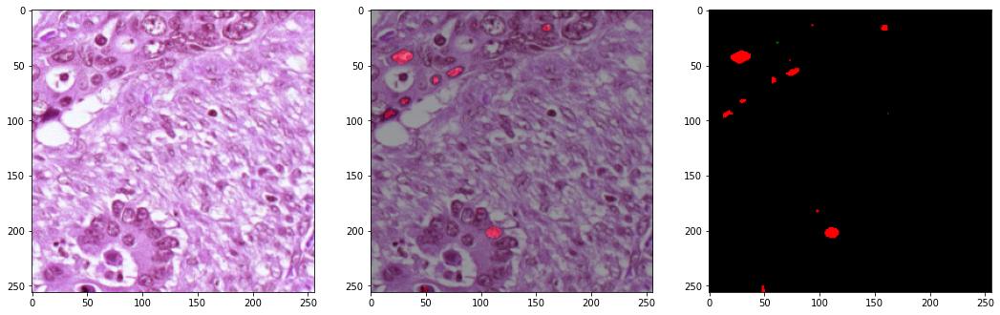

1/1 [==============================] - 0s 71ms/step


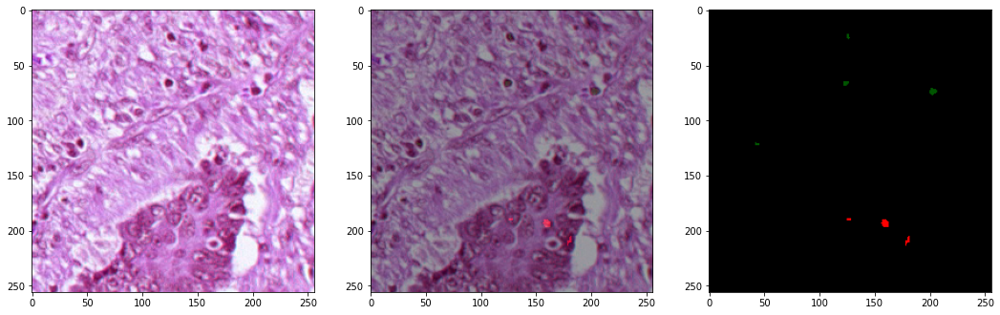

1/1 [==============================] - 0s 66ms/step


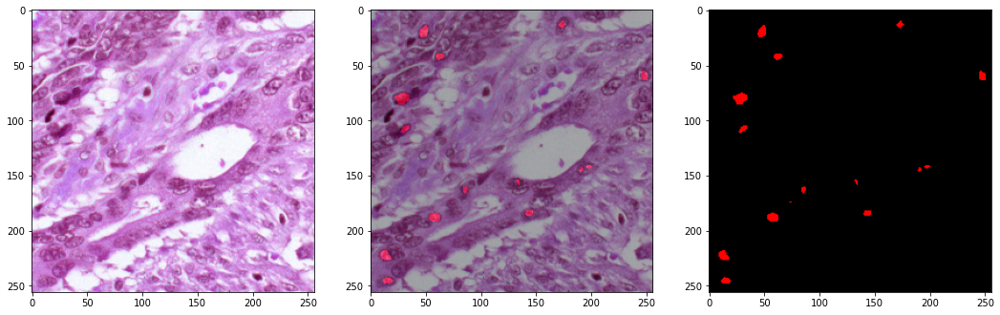

In [ ]:
plot_predictions(test_images[:10], colormap, model=model)